!pip install librosa

In [2]:
#!pip install numpy==1.21.0
#!pip install numba==0.53.0
!pip install librosa
!pip install mpl_interactions

In [4]:
import os
import glob
import fnmatch
import pandas as pd
import numpy as np
import librosa #To deal with Audio files
import librosa.display
from matplotlib.axis import Axis
import mpl_interactions
from mpl_interactions import ioff, panhandler, zoom_factory
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider, Button, RadioButtons 

import IPython.display as ipd
import math
import tensorflow as tf

In [6]:
data_path = r"Mysteth"
print(os.listdir(data_path))

['.ipynb_checkpoints', 'ESMm', 'Murmurs', 'Murmurs (1)', 'normal', 'PSMm', 'Spectrograms', 'sysdias']


In [8]:
tarin_data      = data_path 
# unlabel_data    = data_path  + "/unlabel/"

esm_data     = tarin_data + '/ESMm/'
murmur_data     = tarin_data + '/Murmurs/'
psm_data = tarin_data + '/PSMm/'
diastolic_data   = tarin_data + '/sysdias/diastolic/'
systolic_data   = tarin_data + "/sysdias/systolic/"

In [10]:
print("ESM files:", len(os.listdir(esm_data))) #length of normal training sounds
print("Murmur files:",len(os.listdir(murmur_data))) #length of murmur training sounds 
print("PSM files", len(os.listdir(psm_data))) #length of extrastole training sounds 
print("Diastolic Murmur files:",len(os.listdir(diastolic_data))) #length of artifact training sounds 
print("Systolic Murmur files:",len(os.listdir(systolic_data))) #length of extrahls training sounds 

print('TOTAL TRAIN SOUNDS:', len(os.listdir(esm_data)) 
                              + len(os.listdir(murmur_data))
                              + len(os.listdir(psm_data))
                              + len(os.listdir(diastolic_data))
                              + len(os.listdir(systolic_data)))

ESM files: 15
Murmur files: 129
PSM files 10
Diastolic Murmur files: 30
Systolic Murmur files: 26
TOTAL TRAIN SOUNDS: 210


In [7]:
# print("Test sounds: ", len(os.listdir(unlabel_data)))

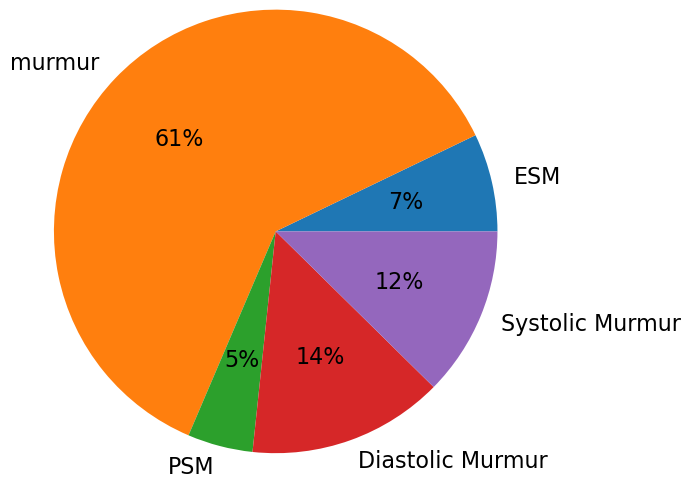

In [12]:
x = np.array([len(os.listdir(esm_data)),
              len(os.listdir(murmur_data)),
              len(os.listdir(psm_data)),
              len(os.listdir(diastolic_data)),
              len(os.listdir(systolic_data))])
labels = ['ESM', 'murmur', 'PSM', 'Diastolic Murmur', 'Systolic Murmur']
plt.pie(x, labels = labels, autopct = '%.0f%%', radius= 1.5, textprops={'fontsize': 16})
plt.show()

In [14]:
pip install numba --upgrade

   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
    --------------------------------------- 0.0/2.7 MB 393.8 kB/s eta 0:00:07
   - -------------------------------------- 0.1/2.7 MB 655.4 kB/s eta 0:00:04
   --- ------------------------------------ 0.2/2.7 MB 1.1 MB/s eta 0:00:03
   ----- ---------------------------------- 0.4/2.7 MB 1.6 MB/s eta 0:00:02
   ---------- ----------------------------- 0.7/2.7 MB 2.4 MB/s eta 0:00:01
   ------------ --------------------------- 0.9/2.7 MB 2.7 MB/s eta 0:00:01
   ------------- -------------------------- 0.9/2.7 MB 2.7 MB/s eta 0:00:01
   ---------------- ----------------------- 1.1/2.7 MB 2.6 MB/s eta 0:00:01
   ----------------------------- ---------- 2.0/2.7 MB 4.5 MB/s eta 0:00:01
   ---------------------------------------  2.7/2.7 MB 5.2 MB/s eta 0:00:01
   --------------------------

In [16]:
#!pip uninstall -y numpy
#!pip uninstall -y setuptools
!pip install setuptools
#!pip install numpy

In [22]:
def visulize_random_sample(folder_name):
  #to hear the audio sample
  random_sample             = np.random.randint(0,len(os.listdir(folder_name)))
  sample_sound              = os.listdir(folder_name)[random_sample]
  sample_address            = folder_name + sample_sound
  sample_sound, sample_rate = librosa.load(sample_address)
  sample_audio              = ipd.Audio(sample_sound, rate=sample_rate)
  return sample_audio

In [24]:
visulize_random_sample(murmur_data)

In [26]:
random_murmur= np.random.randint(0,len(os.listdir(murmur_data))) 
murmur_sound = os.listdir(murmur_data)[random_murmur]
murmur_sound_address = murmur_data+murmur_sound
murmur_sound_sample,sample_rate = librosa.load(murmur_sound_address)
# ipd.Audio(murmur_sound_sample,rate=sample_rate)


In [28]:
random_murmur= np.random.randint(0,len(os.listdir(murmur_data))) 
murmur_sound = os.listdir(murmur_data)[random_murmur]
murmur_sound_address = murmur_data+murmur_sound
murmur_sound_sample,sample_rate = librosa.load(murmur_sound_address)

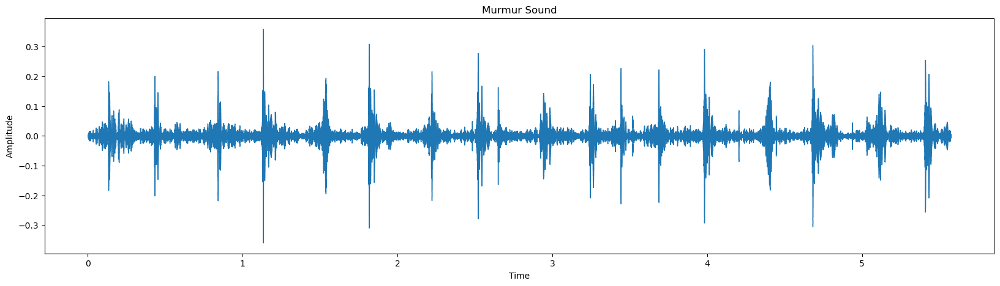

In [30]:
plt.figure(figsize=(20,5))
librosa.display.waveshow(murmur_sound_sample, sr = sample_rate)
plt.title("Murmur Sound")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

In [54]:
signals = [
    librosa.load(f"Mysteth/Murmurs/{p}")[0] for p in os.listdir(murmur_data)
]
plt.figure(figsize=(100, 500))
for i, x in enumerate(signals):
    plt.subplot(25, 4, i+1)
    librosa.display.waveshow(x[:10000])
    plt.ylim(-1, 1)

ValueError: num must be an integer with 1 <= num <= 100, not 101

In [48]:
librosa.load('Mysteth/Murmurs/1.wav')[0]

array([ 0.01493909,  0.02362321,  0.02208307, ..., -0.22073382,
       -0.25903714, -0.18188795], dtype=float32)

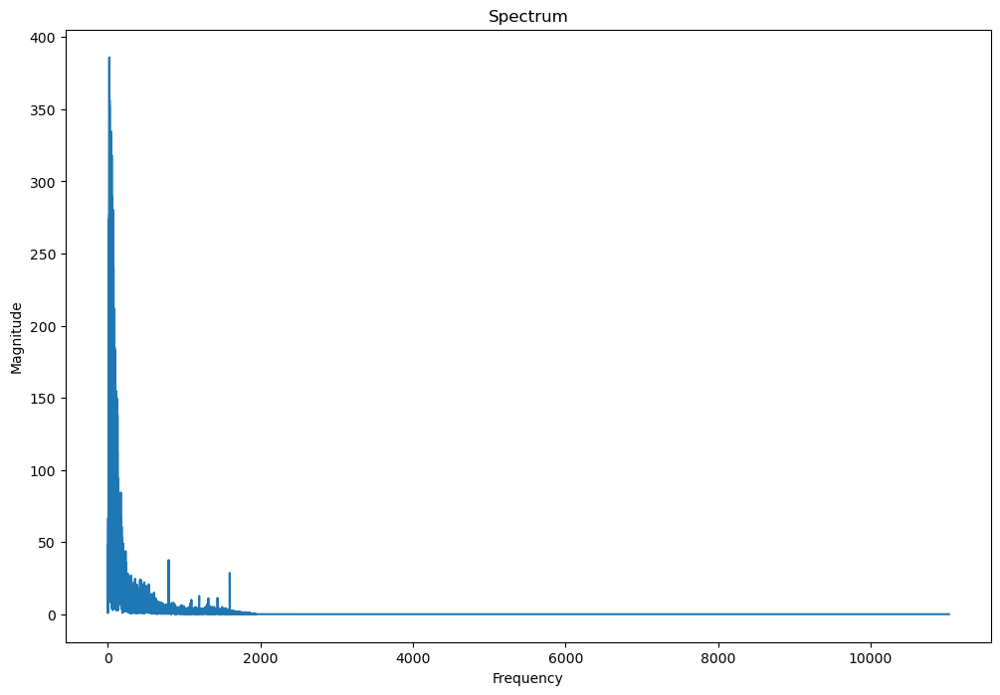

In [56]:
fft_murmur = np.fft.fft(murmur_sound_sample)
magnitude_murmur = np.abs(fft_murmur)
freq_murmur = np.linspace(0,sample_rate, len(magnitude_murmur)) 
half_freq = freq_murmur[:int(len(freq_murmur)/2)]
half_magnitude = magnitude_murmur[:int(len(freq_murmur)/2)]

plt.figure(figsize=(12,8))
plt.plot(half_freq,half_magnitude)
plt.title("Spectrum")
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()

In [58]:
hop_length = 512 # in num. of samples
n_fft = 2048 # window in num. of samples

# calculate duration hop length and window in seconds
hop_length_duration = float(hop_length)/sample_rate
n_fft_duration = float(n_fft)/sample_rate

print("STFT hop length duration is: {}s".format(hop_length_duration))
print("STFT window duration is: {}s".format(n_fft_duration))

# perform stft
stft_murmur = librosa.stft(murmur_sound_sample, n_fft=n_fft, hop_length=hop_length)

# calculate abs values on complex numbers to get magnitude
spectrogram = np.abs(stft_murmur)
log_spectrogram = librosa.amplitude_to_db(spectrogram)

STFT hop length duration is: 0.023219954648526078s
STFT window duration is: 0.09287981859410431s


Text(0.5, 1.0, 'Spectrogram')

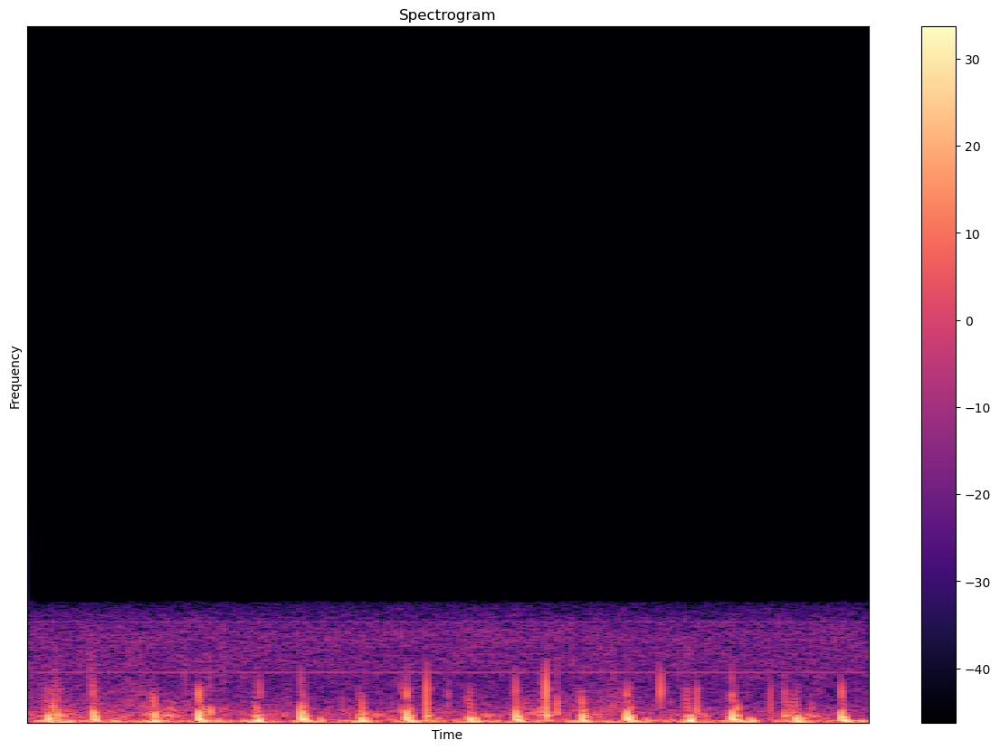

In [60]:
plt.figure(figsize=(15,10))
librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
#plt.set_cmap("YlOrBr")
plt.title("Spectrogram")

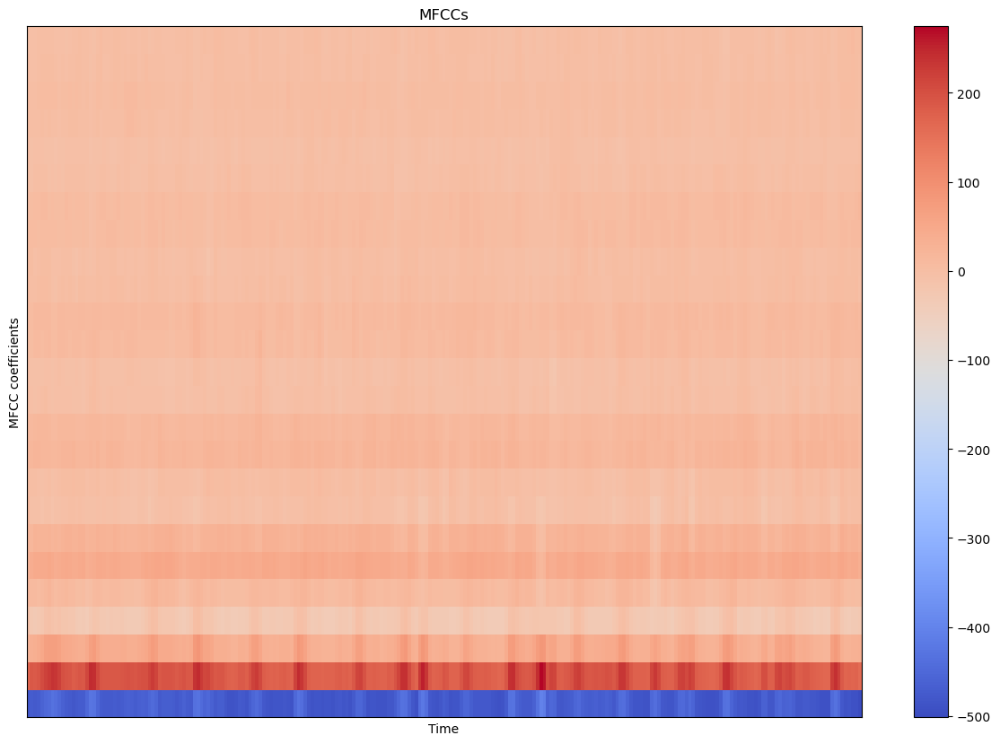

In [62]:
MFCCs = librosa.feature.mfcc(y = murmur_sound_sample, sr = sample_rate, n_fft=n_fft, hop_length=hop_length, n_mfcc=25)

# display MFCCs
plt.figure(figsize=(15,10))
librosa.display.specshow(MFCCs, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("MFCC coefficients")
plt.colorbar()
#plt.set_cmap("YlOrBr")
plt.title("MFCCs")

# show plots
plt.show()

In [64]:
random_esm= np.random.randint(0,len(os.listdir(esm_data))) 
esm_sound = os.listdir(esm_data)[random_esm]
esm_sound_address = murmur_data+murmur_sound
esm_sound_sample,sample_rate = librosa.load(esm_sound_address)
ipd.Audio(esm_sound_sample,rate=sample_rate)

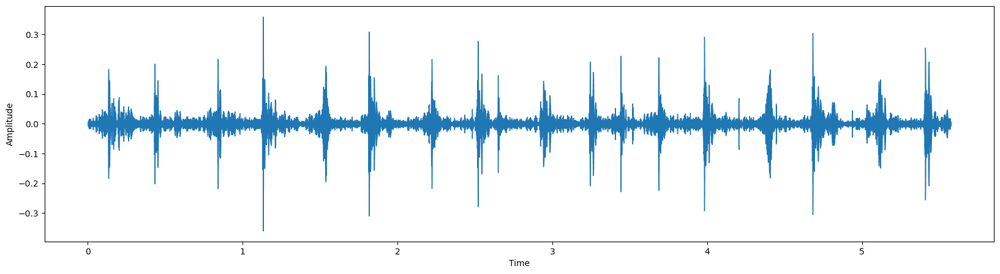

In [66]:
plt.figure(figsize=(20,5))
librosa.display.waveshow(esm_sound_sample, sr = sample_rate)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

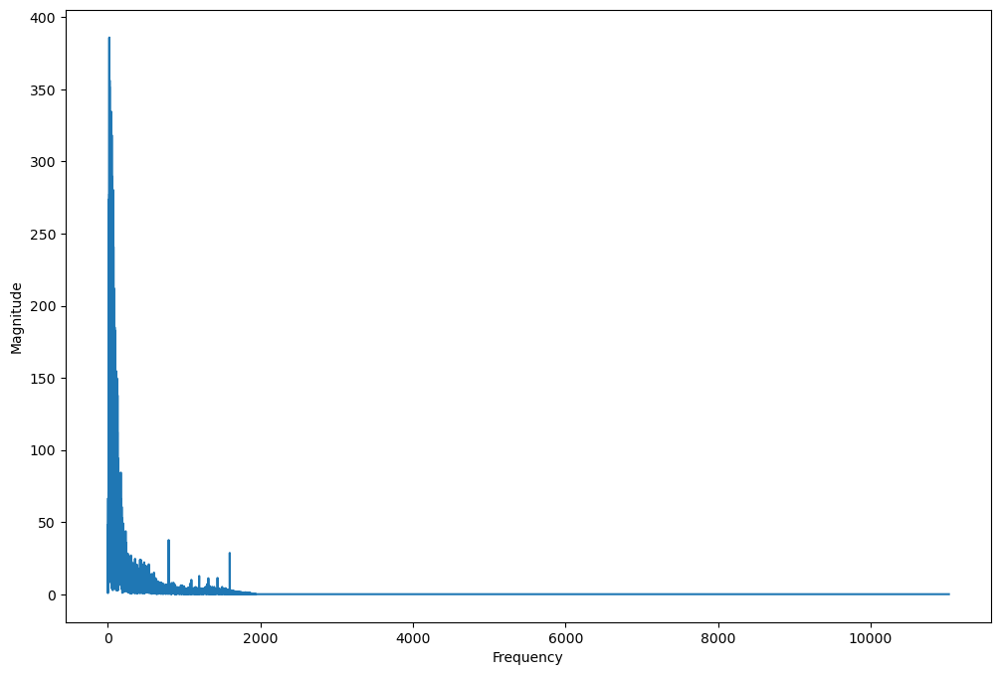

In [68]:
fft_esm = np.fft.fft(esm_sound_sample)
magnitude_esm = np.abs(fft_esm)
freq_esm = np.linspace(0,sample_rate, len(magnitude_esm)) 
half_freq = freq_murmur[:int(len(freq_esm)/2)]
half_magnitude = magnitude_esm[:int(len(freq_esm)/2)]

plt.figure(figsize=(12,8))
plt.plot(half_freq,half_magnitude)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()

In [70]:
hop_length = 512 # in num. of samples
n_fft = 2048 # window in num. of samples

# calculate duration hop length and window in seconds
hop_length_duration = float(hop_length)/sample_rate
n_fft_duration = float(n_fft)/sample_rate

print("STFT hop length duration is: {}s".format(hop_length_duration))
print("STFT window duration is: {}s".format(n_fft_duration))

# perform stft
stft_esm = librosa.stft(esm_sound_sample, n_fft=n_fft, hop_length=hop_length)

# calculate abs values on complex numbers to get magnitude
spectrogram_esm = np.abs(stft_esm)
log_spectrogram_esm = librosa.amplitude_to_db(spectrogram_esm)

STFT hop length duration is: 0.023219954648526078s
STFT window duration is: 0.09287981859410431s


Text(0.5, 1.0, 'Spectrogram_esm')

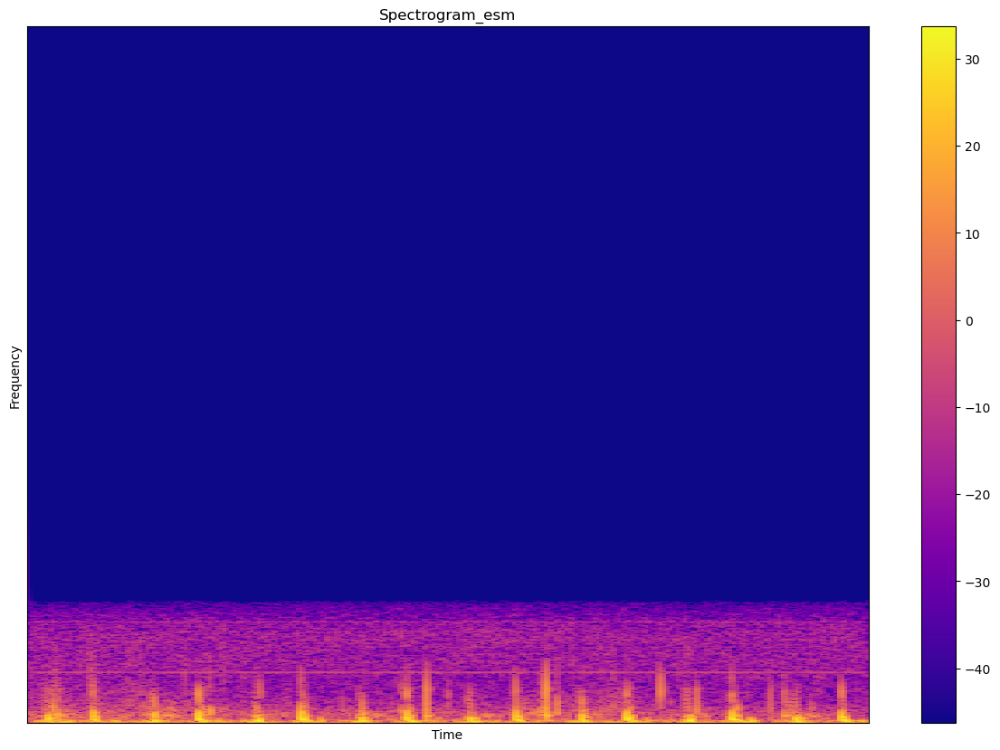

In [72]:
plt.figure(figsize=(15,10))
librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.set_cmap("plasma")
plt.title("Spectrogram_esm")

In [74]:
def load_file_data (folder, file_names, duration=10, sr=22050):
    input_length=sr*duration
    data = []
    for file_name in file_names:
        try:
            sound_file=folder+file_name
            print ("load file ",sound_file)
            X, sr = librosa.load( sound_file, sr=sr, duration=duration) 
            dur = librosa.get_duration(y=X, sr=sr)
            # pad audio file same duration
            if (round(dur) < duration):
                print ("fixing audio lenght :", file_name)
                y = librosa.util.fix_length(X, size = input_length)                
            # extract normalized mfcc feature from data
            mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sr, n_mfcc=25).T,axis=0)             
        except Exception as e:
            print("Error encountered while parsing file: ", file)        
        #feature = np.array(mfccs).reshape([-1,1])
        #data.append(feature)
    return data

In [76]:
#from sklearn.model_selection import train_test_split
#from sklearn import preprocessing

# Map label text to integer
CLASSES = ['esm','psm']
NB_CLASSES=len(CLASSES)

# Map integer value to text labels
label_to_int = {k:v for v,k in enumerate(CLASSES)}
print (label_to_int)
print (" ")
int_to_label = {v:k for k,v in label_to_int.items()}
print(int_to_label)

{'esm': 0, 'psm': 1}
 
{0: 'esm', 1: 'psm'}


In [ ]:
!pip uninstall numpy
!pip install numpy==1.16.4

In [92]:
SAMPLE_RATE = 22050
# seconds
MAX_SOUND_CLIP_DURATION=10

esm_files = fnmatch.filter(os.listdir(esm_data), '*.wav')
esm_sounds = load_file_data (folder=esm_data, file_names = esm_files, duration=MAX_SOUND_CLIP_DURATION)
esm_labels = [0 for items in esm_files]

psm_files = fnmatch.filter(os.listdir(psm_data), '*.wav')
psm_sounds = load_file_data(folder=psm_data,file_names=psm_files, duration=MAX_SOUND_CLIP_DURATION)
psm_labels = [1 for items in psm_sounds]

murmur_files = fnmatch.filter(os.listdir(murmur_data), '*.wav')
murmur_sounds = load_file_data(folder=murmur_data,file_names=murmur_files, duration=MAX_SOUND_CLIP_DURATION)
murmur_labels = [2 for items in murmur_sounds]

load file  Mysteth/ESMm/1.wav
fixing audio lenght : 1.wav
load file  Mysteth/ESMm/10.wav
fixing audio lenght : 10.wav
load file  Mysteth/ESMm/11.wav
fixing audio lenght : 11.wav
load file  Mysteth/ESMm/12.wav
load file  Mysteth/ESMm/13.wav
fixing audio lenght : 13.wav
load file  Mysteth/ESMm/14.wav
fixing audio lenght : 14.wav
load file  Mysteth/ESMm/15.wav
load file  Mysteth/ESMm/2.wav
fixing audio lenght : 2.wav
load file  Mysteth/ESMm/3.wav
fixing audio lenght : 3.wav
load file  Mysteth/ESMm/4.wav
fixing audio lenght : 4.wav
load file  Mysteth/ESMm/5.wav
fixing audio lenght : 5.wav
load file  Mysteth/ESMm/6.wav
fixing audio lenght : 6.wav
load file  Mysteth/ESMm/7.wav
fixing audio lenght : 7.wav
load file  Mysteth/ESMm/8.wav
load file  Mysteth/ESMm/9.wav
fixing audio lenght : 9.wav
load file  Mysteth/PSMm/1.wav
fixing audio lenght : 1.wav
load file  Mysteth/PSMm/10.wav
fixing audio lenght : 10.wav
load file  Mysteth/PSMm/2.wav
fixing audio lenght : 2.wav
load file  Mysteth/PSMm/3.wa

In [93]:
systolic_files = fnmatch.filter(os.listdir(systolic_data), '*.wav')
systolic_sounds = load_file_data(folder=systolic_data,file_names=systolic_files, duration=MAX_SOUND_CLIP_DURATION)
systolic_labels = [2 for items in systolic_files]


diastolic_files = fnmatch.filter(os.listdir(diastolic_data), '*.wav')
diastolic_sounds = load_file_data(folder=diastolic_data,file_names=diastolic_files, duration=MAX_SOUND_CLIP_DURATION)
diastolic_labels = [2 for items in diastolic_files]

print ("Loading Done")

load file  Mysteth/sysdias/systolic/AS.wav
fixing audio lenght : AS.wav
load file  Mysteth/sysdias/systolic/AS2.wav
fixing audio lenght : AS2.wav
load file  Mysteth/sysdias/systolic/AS3.wav
fixing audio lenght : AS3.wav
load file  Mysteth/sysdias/systolic/AVR.wav
fixing audio lenght : AVR.wav
load file  Mysteth/sysdias/systolic/CAS.wav
fixing audio lenght : CAS.wav
load file  Mysteth/sysdias/systolic/earlysystolic.wav
fixing audio lenght : earlysystolic.wav
load file  Mysteth/sysdias/systolic/EAS (1).wav
fixing audio lenght : EAS (1).wav
load file  Mysteth/sysdias/systolic/EAS.wav
fixing audio lenght : EAS.wav
load file  Mysteth/sysdias/systolic/LAS.wav
fixing audio lenght : LAS.wav
load file  Mysteth/sysdias/systolic/late.wav
fixing audio lenght : late.wav
load file  Mysteth/sysdias/systolic/MP.wav
fixing audio lenght : MP.wav
load file  Mysteth/sysdias/systolic/MP2.wav
fixing audio lenght : MP2.wav
load file  Mysteth/sysdias/systolic/MP3.wav
fixing audio lenght : MP3.wav
load file  M

In [94]:
# Bunlabelledtest_files = fnmatch.filter(os.listdir(unlabel_data), 'Bunlabelledtest*.wav')
# Bunlabelledtest_sounds = load_file_data(folder=unlabel_data,file_names=Bunlabelledtest_files, duration=MAX_SOUND_CLIP_DURATION)
# Bunlabelledtest_labels = [-1 for items in Bunlabelledtest_sounds]

# Aunlabelledtest_files = fnmatch.filter(os.listdir(unlabel_data), 'Aunlabelledtest*.wav')
# Aunlabelledtest_sounds = load_file_data(folder=unlabel_data,file_names=Aunlabelledtest_files, duration=MAX_SOUND_CLIP_DURATION)
# Aunlabelledtest_labels = [-1 for items in Aunlabelledtest_sounds]


# print ("Loading of unlabel data done")

load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__175_1307987962616_C.wav
fixing audio lenght : Bunlabelledtest__175_1307987962616_C.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__176_1307988171173_A1.wav
fixing audio lenght : Bunlabelledtest__176_1307988171173_A1.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__176_1307988171173_C.wav
fixing audio lenght : Bunlabelledtest__176_1307988171173_C.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__176_1307988171173_C1.wav
fixing audio lenght : Bunlabelledtest__176_1307988171173_C1.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__177_1307989650056_C.wav
fixing audio lenght : Bunlabelledtest__177_1307989650056_C.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Soun

load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__235_1308749032454_D1.wav
fixing audio lenght : Bunlabelledtest__235_1308749032454_D1.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__237_1308750231222_C1.wav
fixing audio lenght : Bunlabelledtest__237_1308750231222_C1.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__239_1309195730333_D.wav
fixing audio lenght : Bunlabelledtest__239_1309195730333_D.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__240_1309196119795_D.wav
fixing audio lenght : Bunlabelledtest__240_1309196119795_D.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Bunlabelledtest__242_1309197394064_A.wav
fixing audio lenght : Bunlabelledtest__242_1309197394064_A.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Soun

load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Aunlabelledtest__201102081033.wav
fixing audio lenght : Aunlabelledtest__201102081033.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Aunlabelledtest__201102081045.wav
fixing audio lenght : Aunlabelledtest__201102081045.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Aunlabelledtest__201102200848.wav
fixing audio lenght : Aunlabelledtest__201102200848.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Aunlabelledtest__201103011036.wav
fixing audio lenght : Aunlabelledtest__201103011036.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Aunlabelledtest__201103140236.wav
fixing audio lenght : Aunlabelledtest__201103140236.wav
load file  C:\Users\Narender k Jain\Desktop\nsut project\Heartbeat_Sound/unlabel/Aunlabelledtest__201103170122.wav
fixing audio lenght : Aunlabel

In [95]:
df = pd.read_csv("gen_data.csv")
df

,Unnamed: 0,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,...,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,label
0,0,0.741255,0.030027,258.542736,462.063930,603.972026,0.008291,-482.924898,158.010285,49.513083,...,23.440075,45.091119,26.670151,3.356709,8.471904,22.344806,16.740119,1.629938,0.781498,0
1,1,0.685782,0.045363,337.545132,414.768333,680.248482,0.020019,-386.659036,142.393705,55.545774,...,9.376142,27.606059,22.901177,7.315064,4.691585,11.359494,10.468178,2.640731,-0.018301,0
2,2,0.680365,0.106960,236.406535,310.418196,425.052464,0.009596,-365.108827,165.038780,73.843700,...,7.323506,17.919684,12.907859,1.955403,4.070276,13.636248,13.345113,3.427525,-1.845460,0
3,3,0.659038,0.085681,252.770228,344.722768,528.448655,0.007129,-352.971705,164.700363,68.113501,...,4.225514,19.895185,15.306841,0.673473,2.010853,14.914191,16.641516,4.592962,-2.840663,0
4,4,0.722639,0.044622,326.450056,392.974257,723.942498,0.014859,-384.931029,180.703624,53.485611,...,2.924998,31.062495,22.945575,4.227831,7.604981,18.915216,12.423129,-2.824358,-2.611566,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,0.773540,0.029032,2008.343036,2226.871651,3866.602882,0.205657,-456.602479,138.357718,3.857550,...,20.726599,19.327183,9.471340,9.167769,-0.395275,2.872652,-4.548978,-4.571531,-4.892971,0
9996,9996,0.522180,-0.003669,1446.010722,1437.705757,3157.430825,0.054315,-568.464395,0.290319,13.158422,...,20.745338,19.195505,12.087132,10.101109,9.001204,5.463412,5.203886,5.351037,2.541367,1
9997,9997,0.540262,0.070680,697.369099,597.535973,1365.418713,-0.024434,-431.696615,96.139640,12.542365,...,18.051667,9.854638,7.407774,2.398859,3.945867,2.733384,-1.449620,-1.412961,3.441359,1
9998,9998,0.616747,0.063233,516.735243,502.200814,631.975381,-0.002250,-502.450385,52.962291,12.444173,...,24.804854,6.811635,16.023859,7.408679,4.682602,3.421863,5.626320,0.942074,5.680124,1


In [96]:
df = df.drop(["Unnamed: 0"], axis = 1)
x = df.drop(["label"], axis = 1)

In [97]:
y = df["label"]
y

0       0
1       0
2       0
3       0
4       0
       ..
9995    0
9996    1
9997    1
9998    1
9999    1
Name: label, Length: 10000, dtype: int64

In [98]:
x = df.drop(["label"], axis = 1)

In [99]:
x

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13
0,0.741255,0.030027,258.542736,462.063930,603.972026,0.008291,-482.924898,158.010285,49.513083,0.294963,23.440075,45.091119,26.670151,3.356709,8.471904,22.344806,16.740119,1.629938,0.781498
1,0.685782,0.045363,337.545132,414.768333,680.248482,0.020019,-386.659036,142.393705,55.545774,4.204101,9.376142,27.606059,22.901177,7.315064,4.691585,11.359494,10.468178,2.640731,-0.018301
2,0.680365,0.106960,236.406535,310.418196,425.052464,0.009596,-365.108827,165.038780,73.843700,13.407497,7.323506,17.919684,12.907859,1.955403,4.070276,13.636248,13.345113,3.427525,-1.845460
3,0.659038,0.085681,252.770228,344.722768,528.448655,0.007129,-352.971705,164.700363,68.113501,6.205061,4.225514,19.895185,15.306841,0.673473,2.010853,14.914191,16.641516,4.592962,-2.840663
4,0.722639,0.044622,326.450056,392.974257,723.942498,0.014859,-384.931029,180.703624,53.485611,-13.228693,2.924998,31.062495,22.945575,4.227831,7.604981,18.915216,12.423129,-2.824358,-2.611566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.773540,0.029032,2008.343036,2226.871651,3866.602882,0.205657,-456.602479,138.357718,3.857550,33.312107,20.726599,19.327183,9.471340,9.167769,-0.395275,2.872652,-4.548978,-4.571531,-4.892971
9996,0.522180,-0.003669,1446.010722,1437.705757,3157.430825,0.054315,-568.464395,0.290319,13.158422,26.119203,20.745338,19.195505,12.087132,10.101109,9.001204,5.463412,5.203886,5.351037,2.541367
9997,0.540262,0.070680,697.369099,597.535973,1365.418713,-0.024434,-431.696615,96.139640,12.542365,5.962335,18.051667,9.854638,7.407774,2.398859,3.945867,2.733384,-1.449620,-1.412961,3.441359
9998,0.616747,0.063233,516.735243,502.200814,631.975381,-0.002250,-502.450385,52.962291,12.444173,28.034892,24.804854,6.811635,16.023859,7.408679,4.682602,3.421863,5.626320,0.942074,5.680124


In [100]:
x_data = np.concatenate((esm_sounds, psm_sounds,murmur_sounds,systolic_sounds,diastolic_sounds))

y_data = np.concatenate((esm_labels, psm_labels,murmur_labels,systolic_labels,diastolic_labels))

# test_x = np.concatenate((Aunlabelledtest_sounds,Bunlabelledtest_sounds))
# test_y = np.concatenate((Aunlabelledtest_labels,Bunlabelledtest_labels))

print ("combined training data record: ",len(y_data))

combined training data record:  71


In [33]:
x_data

array([[[-4.07496979e+02],
        [ 2.05013428e+02],
        [ 6.19552345e+01],
        ...,
        [ 2.97130370e+00],
        [ 1.32287049e+00],
        [-6.77987337e-01]],

       [[-3.52407715e+02],
        [ 2.43691605e+02],
        [ 5.61286430e+01],
        ...,
        [ 1.24332786e-01],
        [-2.73207355e+00],
        [-1.28184712e+00]],

       [[-3.43595093e+02],
        [ 2.05184952e+02],
        [ 5.89168015e+01],
        ...,
        [ 1.81570697e+00],
        [-2.86927462e+00],
        [-2.45700979e+00]],

       ...,

       [[-4.12462158e+02],
        [ 1.54742584e+02],
        [ 4.60972404e+00],
        ...,
        [-3.07183433e+00],
        [-1.87901068e+00],
        [-1.49847591e+00]],

       [[-4.28554230e+02],
        [ 7.18896866e+01],
        [ 3.43553810e+01],
        ...,
        [ 2.51899099e+00],
        [ 3.69878221e+00],
        [ 4.05151510e+00]],

       [[-4.28554230e+02],
        [ 7.18896866e+01],
        [ 3.43553810e+01],
        ...,
        

In [34]:
x_data.shape

(210, 25, 1)

In [19]:
df

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,label
0,0.656345,0.040474,460.644978,460.957474,990.264250,0.028666,-411.529297,214.955521,41.824654,-35.149975,3.924850,43.072357,19.265223,-14.065839,-5.791058,15.055174,8.228413,-8.968398,-4.605800,normal
1,0.698172,0.058108,282.591730,324.304570,544.566553,0.013136,-397.640076,183.960114,70.156418,1.139876,3.218091,22.197851,14.832939,-2.725713,-1.237478,12.005513,12.899569,1.968508,-1.868524,normal
2,0.662180,0.049098,350.039454,372.615177,698.094199,0.020455,-392.235474,197.262436,60.974525,-14.017620,-2.178896,22.501268,11.461637,-6.530876,2.537093,20.438843,16.396824,-1.255747,-5.904324,normal
3,0.696243,0.075036,377.977165,396.210551,799.030210,0.021452,-341.854401,194.594055,55.016411,-19.128372,-0.958779,30.275915,19.377094,-5.335845,-3.475631,12.877550,13.082479,1.206175,0.225202,normal
4,0.714493,0.134254,239.010005,324.121941,455.597245,0.010223,-349.599579,174.204590,67.280060,3.768966,7.985938,27.562952,21.562719,5.468256,6.171675,16.257715,14.069146,1.479034,-3.687165,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553,0.525188,0.080437,153.843998,375.553680,198.174728,0.010384,-475.087311,90.618546,77.676346,61.106747,44.951687,32.127697,23.669851,18.672144,15.391961,12.351544,8.889525,5.043602,1.216842,Murmurs1
554,0.640680,0.047940,423.284783,349.580574,750.446112,0.024243,-399.817932,240.198578,71.745979,-27.147825,-19.097279,15.200224,12.556531,-5.602257,-1.650740,12.974180,9.952459,-4.299207,-6.111960,Murmurs1
555,0.603103,0.269718,479.511999,396.480823,842.022495,0.035611,-247.054520,272.750885,59.782421,-45.868320,-14.541919,29.860939,12.384420,-18.854061,-9.755730,13.510740,9.538886,-7.212698,-4.780540,Murmurs1
556,0.657480,0.125389,254.460539,285.310893,487.247530,0.013668,-353.372315,210.291489,82.043190,3.211071,3.670083,24.025259,16.957130,-0.766311,0.749053,12.687720,10.793054,-1.926242,-5.191001,Murmurs1


In [110]:
from sklearn.model_selection import train_test_split

In [112]:
CLASSES = ['normal','Diastolic', 'ESM', 'PSM' ]
NB_CLASSES=len(CLASSES)

# Map integer value to text labels
label_to_int = {k:v for v,k in enumerate(CLASSES)}
print (label_to_int)
print (" ")
int_to_label = {v:k for k,v in label_to_int.items()}
print(int_to_label)

{'normal': 0, 'Diastolic': 1, 'ESM': 2, 'PSM': 3}
 
{0: 'normal', 1: 'Diastolic', 2: 'ESM', 3: 'PSM'}


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   chroma_stft         10000 non-null  float64
 1   rmse                10000 non-null  float64
 2   spectral_centroid   10000 non-null  float64
 3   spectral_bandwidth  10000 non-null  float64
 4   rolloff             10000 non-null  float64
 5   zero_crossing_rate  10000 non-null  float64
 6   mfcc1               10000 non-null  float64
 7   mfcc2               10000 non-null  float64
 8   mfcc3               10000 non-null  float64
 9   mfcc4               10000 non-null  float64
 10  mfcc5               10000 non-null  float64
 11  mfcc6               10000 non-null  float64
 12  mfcc7               10000 non-null  float64
 13  mfcc8               10000 non-null  float64
 14  mfcc9               10000 non-null  float64
 15  mfcc10              10000 non-null  float64
 16  mfcc1

In [122]:
y

0       0
1       0
2       0
3       0
4       0
       ..
9995    0
9996    1
9997    1
9998    1
9999    1
Name: label, Length: 10000, dtype: int64

In [128]:
type(y)

pandas.core.series.Series

C:\conda_tmp\ipykernel_16972\3315737544.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y[i]=1
C:\conda_tmp\ipykernel_16972\3315737544.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y[i]=0
C:\conda_tmp\ipykernel_16972\3315737544.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y[i]=0
C:\conda_tmp\ipykernel_16972\3315737544.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

In [130]:
df= df.drop(["label"], axis = 1)
df["label"] = y
df

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,label
0,0.741255,0.030027,258.542736,462.063930,603.972026,0.008291,-482.924898,158.010285,49.513083,0.294963,23.440075,45.091119,26.670151,3.356709,8.471904,22.344806,16.740119,1.629938,0.781498,0
1,0.685782,0.045363,337.545132,414.768333,680.248482,0.020019,-386.659036,142.393705,55.545774,4.204101,9.376142,27.606059,22.901177,7.315064,4.691585,11.359494,10.468178,2.640731,-0.018301,0
2,0.680365,0.106960,236.406535,310.418196,425.052464,0.009596,-365.108827,165.038780,73.843700,13.407497,7.323506,17.919684,12.907859,1.955403,4.070276,13.636248,13.345113,3.427525,-1.845460,0
3,0.659038,0.085681,252.770228,344.722768,528.448655,0.007129,-352.971705,164.700363,68.113501,6.205061,4.225514,19.895185,15.306841,0.673473,2.010853,14.914191,16.641516,4.592962,-2.840663,0
4,0.722639,0.044622,326.450056,392.974257,723.942498,0.014859,-384.931029,180.703624,53.485611,-13.228693,2.924998,31.062495,22.945575,4.227831,7.604981,18.915216,12.423129,-2.824358,-2.611566,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.773540,0.029032,2008.343036,2226.871651,3866.602882,0.205657,-456.602479,138.357718,3.857550,33.312107,20.726599,19.327183,9.471340,9.167769,-0.395275,2.872652,-4.548978,-4.571531,-4.892971,0
9996,0.522180,-0.003669,1446.010722,1437.705757,3157.430825,0.054315,-568.464395,0.290319,13.158422,26.119203,20.745338,19.195505,12.087132,10.101109,9.001204,5.463412,5.203886,5.351037,2.541367,1
9997,0.540262,0.070680,697.369099,597.535973,1365.418713,-0.024434,-431.696615,96.139640,12.542365,5.962335,18.051667,9.854638,7.407774,2.398859,3.945867,2.733384,-1.449620,-1.412961,3.441359,1
9998,0.616747,0.063233,516.735243,502.200814,631.975381,-0.002250,-502.450385,52.962291,12.444173,28.034892,24.804854,6.811635,16.023859,7.408679,4.682602,3.421863,5.626320,0.942074,5.680124,1


In [132]:
df = pd.read_csv("normal_murmur.csv")
y = df["label"]
x = df.drop(["label", "Unnamed: 0"], axis = 1)

In [134]:
x = df.drop(["label"], axis = 1)
x

,Unnamed: 0,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13
0,0,0.682749,-0.000248,351.191371,447.358617,822.589638,0.017266,-456.439013,215.714279,45.952297,-29.985290,6.400365,42.229249,19.023909,-8.033969,7.498815,30.926532,19.687681,-4.870587,-5.514205
1,1,0.770528,0.009881,364.114764,469.961362,886.618439,0.019788,-448.421917,146.422922,35.326630,-15.290256,11.836387,42.368269,30.131914,5.969742,7.211418,20.930864,17.904148,3.373912,-0.003304
2,2,0.716190,0.090164,294.550164,377.343384,614.897575,0.012805,-399.564227,176.864304,59.707848,-3.541984,9.594731,33.293221,21.324876,-2.508552,-2.984140,11.488831,13.559395,3.533452,0.563513
3,3,0.608320,0.111635,342.525827,341.173746,620.053199,0.022584,-329.210489,190.689365,66.581751,-7.115012,-2.646345,20.246710,14.627924,-1.450134,1.012307,12.827746,11.114687,0.227153,-1.349681
4,4,0.688396,0.003064,413.649051,457.202082,945.521426,0.024280,-438.712411,203.638153,48.859442,-25.215633,4.161564,38.793526,19.949420,-9.986127,-5.161049,13.547179,10.181970,-4.797020,-3.387562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,0.727245,0.101115,1466.564879,2197.639842,3722.193095,0.085821,-277.412299,103.042083,19.569476,33.909905,31.690746,12.784362,19.057216,20.956641,10.272428,16.901346,9.075729,3.986881,6.833212
9996,9996,0.791472,0.028700,1755.100749,2115.556178,4001.725634,0.186268,-401.258541,119.668796,2.396461,27.005431,17.786363,10.228129,17.571477,6.727077,2.298762,8.055831,3.986764,1.597122,0.903377
9997,9997,0.612619,0.068658,272.545122,264.173327,340.361310,-0.011607,-459.293360,76.402723,42.731647,23.958963,14.678044,24.569647,16.437904,12.305377,11.835409,14.198354,11.525937,7.655387,4.591410
9998,9998,0.602326,0.063307,-138.223342,280.575743,-504.858167,0.019351,-466.976712,172.242185,68.790093,50.540541,43.752111,26.558034,19.863926,7.354442,-0.953004,11.705799,5.625019,-6.452867,-1.367736


In [322]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, random_state=42, shuffle=True)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.7, random_state=42, shuffle=True)

# One-Hot encoding for classes
y_train = np.array(tf.keras.utils.to_categorical(y_train, 2))
y_test = np.array(tf.keras.utils.to_categorical(y_test, 2))
y_val = np.array(tf.keras.utils.to_categorical(y_val, 2))
#test_y=np.array(tf.keras.utils.to_categorical(test_y, len(CLASSES)))

In [138]:
len(y_train)

4900

In [146]:
count = 0
for i in range(0,4900):
    if (y_train[i][1]== 2):
        count=count+1
count

0

In [247]:
y_train

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [0., 1.]])

In [148]:
TRAIN_IMG_COUNT = 4900
COUNT_0 = 3944 #normal
COUNT_1 = 956 #murmur
COUNT_2 = 330 #murmur1
weight_for_0 = TRAIN_IMG_COUNT / (2 * COUNT_0)
weight_for_1 = TRAIN_IMG_COUNT / (2 * COUNT_1)
weight_for_2 = TRAIN_IMG_COUNT / (3 * COUNT_2)
class_weight = {0: weight_for_0, 1: weight_for_1}
class_weight

{0: 0.6211967545638946, 1: 2.562761506276151}

In [150]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, LSTM, Bidirectional, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau, ModelCheckpoint,TensorBoard,ProgbarLogger
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping
from tensorflow.keras.regularizers import l2
from sklearn import metrics 
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [172]:
import keras

In [227]:
keras.backend.clear_session()
model = Sequential()

model.add(Bidirectional(LSTM(128, dropout=0.05, recurrent_dropout=0.20, return_sequences=True), input_shape = (20,1)))

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(128,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Flatten(input_shape=(19, 64)))
#model.add(Dense(1280, activation='relu'))
model.add(Dense(2, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer=Adam(1e-4), metrics=['acc'])

model.summary()

C:\Users\kopal\anaconda\Lib\site-packages\keras\src\layers\rnn\bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\kopal\anaconda\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 20, 256)        │       133,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 20, 128)        │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 20, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20, 128)        │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 20, 64)         │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 20, 64)         │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │         2,562 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 197,506 (771.51 KB)

 Trainable params: 197,506 (771.51 KB)

 Non-trainable params: 0 (0.00 B)

In [228]:
weight_saver = ModelCheckpoint('set_a_weights.weights.h5', monitor='val_loss', 
                               save_best_only=True, save_weights_only=True)
annealer = LearningRateScheduler(lambda x: 1e-3 * 0.8**x)

In [229]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [233]:
history=model.fit(x_train, y_train, 
                  batch_size=3, 
                  epochs=30,
                  class_weight=class_weight,
                  callbacks=[weight_saver, annealer],
                  validation_data=(x_val, y_val)) 

Epoch 1/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 28s 11ms/step - acc: 0.8269 - loss: 0.4074 - val_acc: 0.8700 - val_loss: 0.3362 - learning_rate: 0.0010
Epoch 2/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 19s 10ms/step - acc: 0.8835 - loss: 0.2749 - val_acc: 0.8271 - val_loss: 0.3776 - learning_rate: 8.0000e-04
Epoch 3/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - acc: 0.8940 - loss: 0.2362 - val_acc: 0.9152 - val_loss: 0.2394 - learning_rate: 6.4000e-04
Epoch 4/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - acc: 0.9051 - loss: 0.2206 - val_acc: 0.9181 - val_loss: 0.2570 - learning_rate: 5.1200e-04
Epoch 5/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 19s 9ms/step - acc: 0.9082 - loss: 0.2103 - val_acc: 0.9181 - val_loss: 0.2376 - learning_rate: 4.0960e-04
Epoch 6/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 16s 10ms/step - acc: 0.9130 - loss: 0.1877 - val_acc: 0.9229 - val_loss: 0.2043 - learning_rate: 3.2768e-04
Epoch 7/30
1634/1634 ━━━━━━━━━━━━━━━━━━━━ 16s 9ms/step - acc: 0.9216 - loss: 0.1791 - val_acc: 0.9238 - v

In [281]:
y_pred = (model.predict(x_test) > 0.5).astype(int)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest accuracy: {accuracy}")

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Test accuracy: 0.9236666666666666


In [ ]:
y_test

In [283]:
y_test = np.argmax(y_test, axis=1)
y_pred = y_pred[:, 1] 

In [289]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report, roc_curve
import matplotlib.pyplot as plt
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"ROC-AUC: {roc_auc:.2f}")

Precision: 0.73
Recall: 0.93
F1 Score: 0.82
ROC-AUC: 0.93


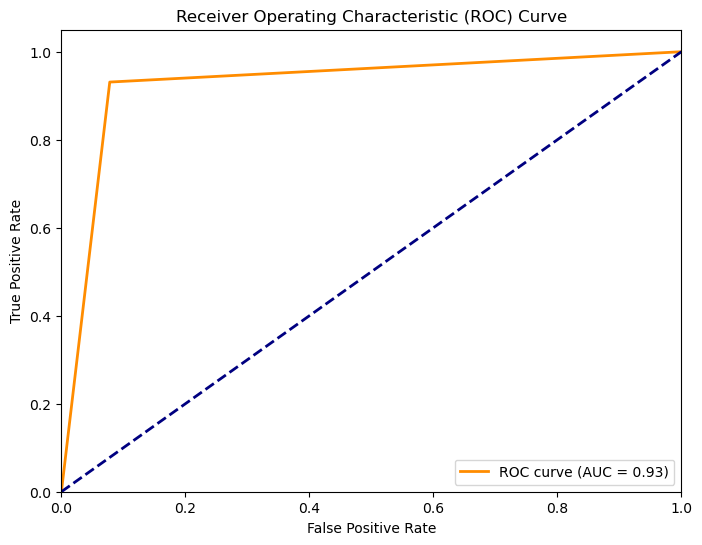

In [291]:
fpr, tpr, _ = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [431]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
model = Sequential()
model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(20, 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid')) 

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

C:\Users\kopal\anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [433]:
y_pred = (model.predict(x_test) > 0.5).astype(int)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest accuracy: {accuracy}")

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step

Test accuracy: 0.18366666666666667


Precision: 0.18
Recall: 1.00
F1 Score: 0.31
ROC-AUC: 0.50


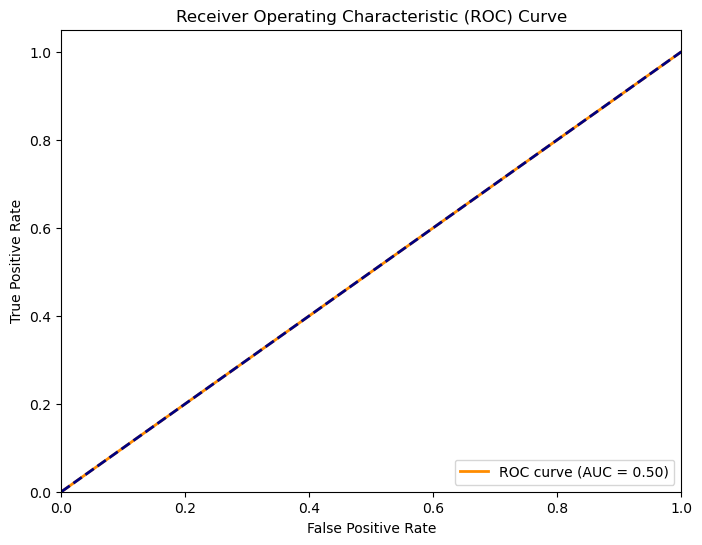

In [439]:
#y_test = np.argmax(y_test, axis=1)
#y_pred = y_pred[:, 1] 
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"ROC-AUC: {roc_auc:.2f}")

fpr, tpr, _ = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [334]:
model = models.Sequential()
model.add(layers.Dense(64, activation='relu', input_shape=(x_train.shape[1],)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(2, activation='sigmoid'))  # For binary classification

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',  # For binary classification
              metrics=['accuracy'])

# Train the model
model.fit(x_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

# Evaluate the model on the test set
y_pred = (model.predict(x_test) > 0.5).astype(int)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest accuracy: {accuracy}")

C:\Users\kopal\anaconda\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7769 - loss: 63.4680 - val_accuracy: 0.8673 - val_loss: 2.2845
Epoch 2/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8785 - loss: 3.0665 - val_accuracy: 0.9173 - val_loss: 1.6946
Epoch 3/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9097 - loss: 1.9048 - val_accuracy: 0.9255 - val_loss: 1.6366
Epoch 4/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9021 - loss: 1.9993 - val_accuracy: 0.9316 - val_loss: 0.9530
Epoch 5/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8690 - loss: 3.2196 - val_accuracy: 0.8500 - val_loss: 3.0391
Epoch 6/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8970 - loss: 2.9052 - val_accuracy: 0.9316 - val_loss: 1.0596
Epoch 7/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8964 - loss: 2.4291 - val_accuracy: 0.8714 - val_loss: 2.8988
Epoch 8/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8930 - loss: 2.5351 - val_accuracy: 0

In [344]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [346]:
y_test = np.argmax(y_test, axis=1)
#y_pred = y_pred[:, 1] 
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"ROC-AUC: {roc_auc:.2f}")

Precision: 0.98
Recall: 0.17
F1 Score: 0.30
ROC-AUC: 0.59


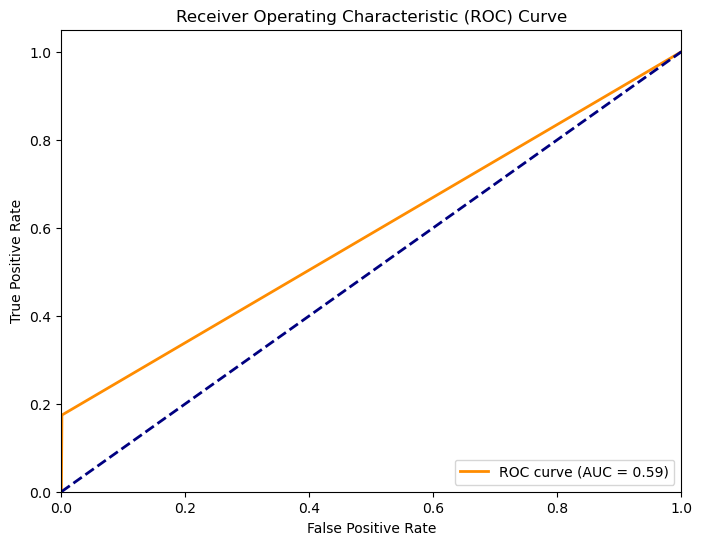

In [348]:
fpr, tpr, _ = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [350]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, random_state=42, shuffle=True)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.7, random_state=42, shuffle=True)

# One-Hot encoding for classes
y_train = np.array(tf.keras.utils.to_categorical(y_train, 2))
y_test = np.array(tf.keras.utils.to_categorical(y_test, 2))
y_val = np.array(tf.keras.utils.to_categorical(y_val, 2))
#test_y=np.array(tf.keras.utils.to_categorical(test_y, len(CLASSES)))

model = models.Sequential()

# Convolutional layers for spatial feature extraction
model.add(layers.Conv1D(32, kernel_size=3, activation='relu', input_shape=(19, 1)))
model.add(layers.MaxPooling1D(pool_size=2))

# LSTM layer for capturing temporal dependencies
model.add(layers.LSTM(64, activation='relu', dropout=0.2, recurrent_dropout=0.2))

# Dense layers for further processing
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(2, activation='sigmoid'))  # For binary classification

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',  # For binary classification
              metrics=['accuracy'])

# Train the model
model.fit(x_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

# Evaluate the model on the test set
y_pred = (model.predict(x_test) > 0.5).astype(int)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest accuracy: {accuracy}")

C:\Users\kopal\anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.6392 - loss: 12.9280 - val_accuracy: 0.8020 - val_loss: 5.1444
Epoch 2/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6682 - loss: 4.5052 - val_accuracy: 0.7969 - val_loss: 8.2985
Epoch 3/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.7358 - loss: 3.5174 - val_accuracy: 0.8286 - val_loss: 1.0741
Epoch 4/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6893 - loss: 2.6457 - val_accuracy: 0.8010 - val_loss: 1.9782
Epoch 5/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7065 - loss: 2.6194 - val_accuracy: 0.7908 - val_loss: 2.0754
Epoch 6/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7167 - loss: 1.9847 - val_accuracy: 0.7878 - val_loss: 1.9904
Epoch 7/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.7351 - loss: 1.8457 - val_accuracy: 0.8194 - val_loss: 1.8554
Epoch 8/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7361 - loss: 1.5285 - val_ac

Precision: 1.00
Recall: 0.05
F1 Score: 0.10
ROC-AUC: 0.53


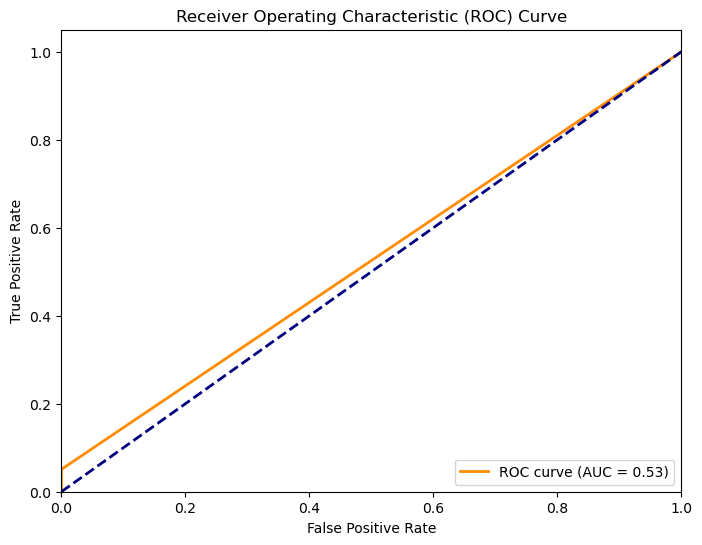

In [356]:
#y_test = np.argmax(y_test, axis=1)
y_pred = y_pred[:, 1] 
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"ROC-AUC: {roc_auc:.2f}")

fpr, tpr, _ = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [358]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, random_state=42, shuffle=True)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.7, random_state=42, shuffle=True)

# One-Hot encoding for classes
y_train = np.array(tf.keras.utils.to_categorical(y_train, 2))
y_test = np.array(tf.keras.utils.to_categorical(y_test, 2))
y_val = np.array(tf.keras.utils.to_categorical(y_val, 2))
#test_y=np.array(tf.keras.utils.to_categorical(test_y, len(CLASSES)))

Epoch 1/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.8238 - loss: 0.5179 - val_accuracy: 0.9123 - val_loss: 0.4923
Epoch 2/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8122 - loss: 0.5392 - val_accuracy: 0.8217 - val_loss: 0.4237
Epoch 3/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8133 - loss: 0.5986 - val_accuracy: 0.8183 - val_loss: 0.6121
Epoch 4/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8093 - loss: 0.6066 - val_accuracy: 0.8170 - val_loss: 0.7718
Epoch 5/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8178 - loss: 0.5636 - val_accuracy: 0.8217 - val_loss: 0.6068
Epoch 6/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.7964 - loss: 0.7181 - val_accuracy: 0.8203 - val_loss: 0.4072
Epoch 7/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8280 - loss: 0.4771 - val_accuracy: 0.8203 - val_loss: 0.3839
Epoch 8/10
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8104 - loss: 0.5987 - val_accu

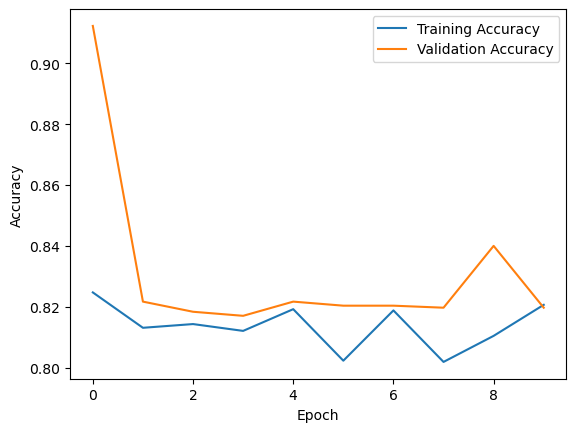

In [360]:
history = model.fit(x_train, y_train, epochs=10, validation_data=(x_test, y_test))

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print(f"\nTest accuracy: {test_acc}")

# Plot training history
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [362]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, random_state=42, shuffle=True)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.7, random_state=42, shuffle=True)

# One-Hot encoding for classes
y_train = np.array(tf.keras.utils.to_categorical(y_train, 2))
y_test = np.array(tf.keras.utils.to_categorical(y_test, 2))
y_val = np.array(tf.keras.utils.to_categorical(y_val, 2))
#test_y=np.array(tf.keras.utils.to_categorical(test_y, len(CLASSES)))

In [364]:
model = models.Sequential()

# Convolutional layers for local feature extraction
model.add(layers.Conv1D(32, kernel_size=3, activation='relu', input_shape=(19, 1)))
model.add(layers.MaxPooling1D(pool_size=2))
#model.add(layers.Flatten())

# Bidirectional GRU for capturing sequential dependencies
model.add(layers.Bidirectional(layers.GRU(64, activation='relu', dropout=0.2, recurrent_dropout=0.2)))

# Dense layers for further processing
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(2, activation='sigmoid'))  # For binary classification

# Compile the model"
model.compile(optimizer='adam',
              loss='binary_crossentropy',  # For binary classification
              metrics=['accuracy'])

# Train the model
model.fit(x_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

# Evaluate the model on the test set
y_pred = (model.predict(x_test) > 0.5).astype(int)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest accuracy: {accuracy}")

C:\Users\kopal\anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.6483 - loss: 36.8117 - val_accuracy: 0.4612 - val_loss: 6.5491
Epoch 2/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7132 - loss: 12.4693 - val_accuracy: 0.8143 - val_loss: 0.8158
Epoch 3/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7667 - loss: 4.3191 - val_accuracy: 0.7959 - val_loss: 0.6134
Epoch 4/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8008 - loss: 1.4521 - val_accuracy: 0.7959 - val_loss: 0.5885
Epoch 5/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.8041 - loss: 1.1657 - val_accuracy: 0.7959 - val_loss: 0.5531
Epoch 6/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7990 - loss: 0.9491 - val_accuracy: 0.7959 - val_loss: 0.5173
Epoch 7/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.8058 - loss: 0.6778 - val_accuracy: 0.7959 - val_loss: 0.4908
Epoch 8/30
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.8059 - loss: 0.6258 - val_ac

In [366]:
losses = pd.DataFrame(model.history.history)
losses[['loss','val_loss']].plot()

KeyError: "None of [Index(['loss', 'val_loss'], dtype='object')] are in the [columns]"

<AxesSubplot:>

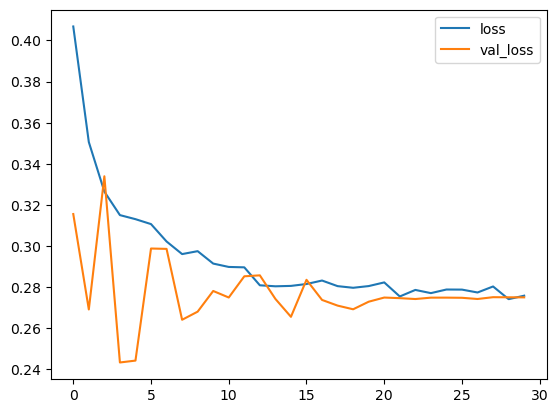

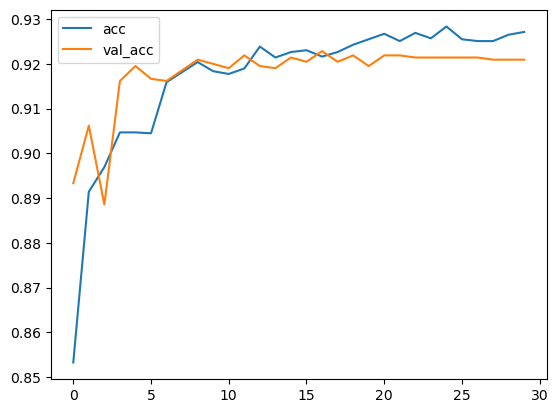

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [18]:
losses[['acc','val_acc']].plot()

In [368]:
y_pred = model.predict(x_test, batch_size=5)
#check scores
scores = model.evaluate(x_test, y_test)
print ("Model evaluation accuracy: ", round(scores[1]*100),"%")

600/600 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8869 - loss: 0.2379
Model evaluation accuracy:  89 %


In [390]:
y_pred = np.round(y_pred, decimals=0)

Precision: 0.68
Recall: 0.74
F1 Score: 0.71
ROC-AUC: 0.83


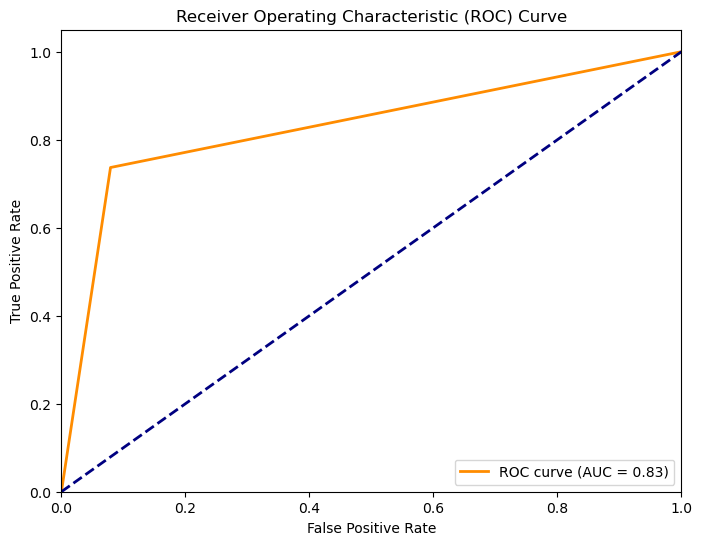

In [392]:
#y_test = np.argmax(y_test, axis=1)
#y_pred = y_pred[:, 1] 
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"ROC-AUC: {roc_auc:.2f}")

fpr, tpr, _ = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [394]:
model.save('heart_sounds.h5')

In [396]:
y_pred = np.asarray(model.predict(x_test, batch_size=32))
y_pred = np.argmax(y_pred,axis=1)
print ("prediction test return :",y_pred[1], "-", int_to_label[y_pred[1]])

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
prediction test return : 0 - normal


In [398]:
def preprocessing (file_path, duration=10, sr=22050):
  input_length=sr*duration
  process_file=[]
  X, sr = librosa.load(file_path, sr=sr, duration=duration) 
  dur = librosa.get_duration(y=X, sr=sr)
  # pad audio file same duration
  if (round(dur) < duration):
    y = librosa.util.fix_length(X, input_length)                
  mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sr, n_mfcc=40, n_fft=512,hop_length=2048).T,axis=0)
  feature = np.array(mfccs).reshape([-1,1])
  process_file.append(feature)
  process_file_array = np.asarray(process_file)
  return process_file_array

In [400]:
y_pred = np.asarray(model.predict(x_test, batch_size=32))
y_pred = np.argmax(y_pred,axis=1)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


In [62]:
target_names = ["artifact", "murmur","normal"]
print(classification_report(y_test.argmax(axis=1), y_pred, target_names = target_names))

              precision    recall  f1-score   support

    artifact       0.80      0.70      0.75       105
      murmur       0.31      0.25      0.28        36
      normal       0.17      0.30      0.22        27

    accuracy                           0.54       168
   macro avg       0.43      0.42      0.41       168
weighted avg       0.60      0.54      0.56       168



In [63]:
pip install ydata-synthetic

  Using cached numpy-1.23.5-cp39-cp39-win_amd64.whl (14.7 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.0
    Uninstalling numpy-1.21.0:
      Successfully uninstalled numpy-1.21.0
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\Public\\anaconda\\Lib\\site-packages\\~6mpy\\.libs\\libopenblas.GK7GX5KEQ4F6UYO3P26ULGBQYHGQO7J4.gfortran-win_amd64.dll'
Consider using the `--user` option or check the permissions.



In [40]:
x_test

array([[[-3.6504840e+02],
        [ 1.7979912e+02],
        [ 7.0183128e+01],
        ...,
        [ 1.5161338e+00],
        [ 1.3050276e-01],
        [-1.4209825e-01]],

       [[-3.9981793e+02],
        [ 2.4019856e+02],
        [ 7.1745979e+01],
        ...,
        [ 2.2230084e+00],
        [-9.5694774e-01],
        [-3.2067616e+00]],

       [[-3.9614902e+02],
        [ 1.9080812e+02],
        [ 6.5992294e+01],
        ...,
        [ 2.6781595e+00],
        [ 9.3734932e-01],
        [-1.2604589e+00]],

       ...,

       [[-3.3582825e+02],
        [ 1.9002840e+02],
        [ 6.5868088e+01],
        ...,
        [ 3.0989599e+00],
        [ 1.0703608e+00],
        [-5.1487231e-01]],

       [[-3.9855768e+02],
        [ 1.9192873e+02],
        [ 5.3093906e+01],
        ...,
        [ 2.0540099e+00],
        [-1.4855764e+00],
        [-4.4356218e-01]],

       [[-4.4448004e+02],
        [ 2.2271266e+02],
        [ 3.6174370e+01],
        ...,
        [ 4.7780079e-01],
        [-6.010

In [41]:
y_test

array([[0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 1

In [42]:
len(x_test)

117

In [43]:
len(y_test)

117

In [44]:
len(x_test[0])

25

In [45]:
x_test.shape

(117, 25, 1)

In [46]:
x_test = np.reshape(x_test, (117,-1))
x_test

array([[-3.6504840e+02,  1.7979912e+02,  7.0183128e+01, ...,
         1.5161338e+00,  1.3050276e-01, -1.4209825e-01],
       [-3.9981793e+02,  2.4019856e+02,  7.1745979e+01, ...,
         2.2230084e+00, -9.5694774e-01, -3.2067616e+00],
       [-3.9614902e+02,  1.9080812e+02,  6.5992294e+01, ...,
         2.6781595e+00,  9.3734932e-01, -1.2604589e+00],
       ...,
       [-3.3582825e+02,  1.9002840e+02,  6.5868088e+01, ...,
         3.0989599e+00,  1.0703608e+00, -5.1487231e-01],
       [-3.9855768e+02,  1.9192873e+02,  5.3093906e+01, ...,
         2.0540099e+00, -1.4855764e+00, -4.4356218e-01],
       [-4.4448004e+02,  2.2271266e+02,  3.6174370e+01, ...,
         4.7780079e-01, -6.0104418e+00, -1.6152065e+00]], dtype=float32)

In [47]:
df = pd.DataFrame(x_test, columns = ["Feature1","Feature2","Feature3","Feature4","Feature5","Feature6","Feature7","Feature8","Feature9","Feature10","Feature11","Feature12","Feature13","Feature14","Feature15","Feature16","Feature17","Feature18","Feature19","Feature20","Feature21","Feature22","Feature23","Feature24","Feature25"])
df

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,...,Feature16,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,Feature25
0,-365.048401,179.799118,70.183128,3.615759,5.161070,23.676535,19.786896,8.197821,11.780345,19.907194,...,1.351794,-3.363132,0.034826,4.310290,3.454080,1.097177,1.198282,1.516134,0.130503,-0.142098
1,-399.817932,240.198563,71.745979,-27.147820,-19.097279,15.200221,12.556531,-5.602255,-1.650742,12.974180,...,-3.615676,-4.475657,3.214195,6.502878,1.605149,-1.730747,0.778409,2.223008,-0.956948,-3.206762
2,-396.149017,190.808121,65.992294,-4.692991,4.687824,28.455683,19.127953,-0.475288,3.122702,18.145008,...,-0.038368,-3.140382,1.183407,4.128746,0.945303,-1.807518,0.386059,2.678159,0.937349,-1.260459
3,-354.538330,224.755203,79.967079,-3.732658,3.091108,26.903955,16.033400,-3.917657,1.511819,17.238222,...,-2.784121,-3.751964,1.654911,3.016401,-1.223351,-2.556610,0.594867,1.156427,-2.084368,-2.518104
4,-369.381683,255.029358,62.214542,-37.282833,-12.078745,27.999918,11.162772,-20.365377,-13.772975,10.005653,...,-4.145544,-6.404104,0.872981,2.116719,-4.080445,-5.024123,0.724393,2.182021,-2.462403,-3.855212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,-418.225189,103.310463,17.579212,40.909351,16.928963,21.028467,3.923450,9.730376,1.666171,3.491797,...,-2.202618,-4.475461,-1.739356,-7.167346,-1.419623,-3.289159,-1.440257,-5.696136,-1.082273,-2.832245
113,-399.456757,202.672806,49.620449,-22.859955,4.707345,36.095764,17.313486,-8.736948,-0.425301,17.630396,...,-3.439277,-3.338297,4.578865,5.117500,-0.703937,-1.301787,2.086154,0.356120,-3.700876,-1.030234
114,-335.828247,190.028397,65.868088,-4.598967,3.267165,24.247044,12.943541,-6.728213,-1.967020,14.564811,...,1.563375,-0.771632,3.317834,5.074182,1.142637,-1.328766,1.184273,3.098960,1.070361,-0.514872
115,-398.557678,191.928726,53.093906,-15.665942,5.194850,33.346146,19.471857,-2.121437,5.305721,21.661257,...,-3.564271,-3.124993,4.533498,5.954593,0.684596,-0.728373,2.444573,2.054010,-1.485576,-0.443562


In [48]:
output = pd.DataFrame(y_test, columns = ["Artifact", "Murmur", "Normal"])
output

,Artifact,Murmur,Normal
0,0.0,0.0,1.0
1,0.0,1.0,0.0
2,0.0,0.0,1.0
3,0.0,1.0,0.0
4,0.0,1.0,0.0
...,...,...,...
112,0.0,0.0,1.0
113,0.0,0.0,1.0
114,0.0,0.0,1.0
115,0.0,0.0,1.0


In [49]:
op = []

In [50]:
for i in range (0,117):
    if (output.at[i,'Artifact']==1):
        op.append(0)
    elif (output.at[i,'Murmur']==1):
        op.append(1)
    else:
        op.append(2)
op

[2,
 1,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 0,
 2,
 1,
 2,
 2,
 2,
 1,
 0,
 2,
 1,
 2,
 2,
 2,
 2,
 1,
 2,
 1,
 2,
 2,
 2,
 2,
 0,
 1,
 2,
 0,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 0,
 2,
 2,
 2,
 1,
 2,
 0,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 0,
 2,
 2,
 1,
 2,
 1,
 1,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 0,
 2,
 1,
 2,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2]

In [51]:
target = pd.DataFrame(op, columns = ["Target"])
target

,Target
0,2
1,1
2,2
3,1
4,1
...,...
112,2
113,2
114,2
115,2


In [52]:
test = pd.concat([df, target], axis=1)
test

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,...,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,Feature25,Target
0,-365.048401,179.799118,70.183128,3.615759,5.161070,23.676535,19.786896,8.197821,11.780345,19.907194,...,-3.363132,0.034826,4.310290,3.454080,1.097177,1.198282,1.516134,0.130503,-0.142098,2
1,-399.817932,240.198563,71.745979,-27.147820,-19.097279,15.200221,12.556531,-5.602255,-1.650742,12.974180,...,-4.475657,3.214195,6.502878,1.605149,-1.730747,0.778409,2.223008,-0.956948,-3.206762,1
2,-396.149017,190.808121,65.992294,-4.692991,4.687824,28.455683,19.127953,-0.475288,3.122702,18.145008,...,-3.140382,1.183407,4.128746,0.945303,-1.807518,0.386059,2.678159,0.937349,-1.260459,2
3,-354.538330,224.755203,79.967079,-3.732658,3.091108,26.903955,16.033400,-3.917657,1.511819,17.238222,...,-3.751964,1.654911,3.016401,-1.223351,-2.556610,0.594867,1.156427,-2.084368,-2.518104,1
4,-369.381683,255.029358,62.214542,-37.282833,-12.078745,27.999918,11.162772,-20.365377,-13.772975,10.005653,...,-6.404104,0.872981,2.116719,-4.080445,-5.024123,0.724393,2.182021,-2.462403,-3.855212,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,-418.225189,103.310463,17.579212,40.909351,16.928963,21.028467,3.923450,9.730376,1.666171,3.491797,...,-4.475461,-1.739356,-7.167346,-1.419623,-3.289159,-1.440257,-5.696136,-1.082273,-2.832245,2
113,-399.456757,202.672806,49.620449,-22.859955,4.707345,36.095764,17.313486,-8.736948,-0.425301,17.630396,...,-3.338297,4.578865,5.117500,-0.703937,-1.301787,2.086154,0.356120,-3.700876,-1.030234,2
114,-335.828247,190.028397,65.868088,-4.598967,3.267165,24.247044,12.943541,-6.728213,-1.967020,14.564811,...,-0.771632,3.317834,5.074182,1.142637,-1.328766,1.184273,3.098960,1.070361,-0.514872,2
115,-398.557678,191.928726,53.093906,-15.665942,5.194850,33.346146,19.471857,-2.121437,5.305721,21.661257,...,-3.124993,4.533498,5.954593,0.684596,-0.728373,2.444573,2.054010,-1.485576,-0.443562,2


In [53]:
pip install ydata-synthetic[streamlit]

^C
Note: you may need to restart the kernel to use updated packages.


In [61]:
test.to_csv('data.csv')

In [9]:
import pmlb
from pmlb import fetch_data

from ydata_synthetic.synthesizers.regular import RegularSynthesizer
from ydata_synthetic.synthesizers import ModelParameters, TrainParameters

In [63]:
data = test
data


,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,...,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,Feature25,Target
0,-365.048401,179.799118,70.183128,3.615759,5.161070,23.676535,19.786896,8.197821,11.780345,19.907194,...,-3.363132,0.034826,4.310290,3.454080,1.097177,1.198282,1.516134,0.130503,-0.142098,2
1,-399.817932,240.198563,71.745979,-27.147820,-19.097279,15.200221,12.556531,-5.602255,-1.650742,12.974180,...,-4.475657,3.214195,6.502878,1.605149,-1.730747,0.778409,2.223008,-0.956948,-3.206762,1
2,-396.149017,190.808121,65.992294,-4.692991,4.687824,28.455683,19.127953,-0.475288,3.122702,18.145008,...,-3.140382,1.183407,4.128746,0.945303,-1.807518,0.386059,2.678159,0.937349,-1.260459,2
3,-354.538330,224.755203,79.967079,-3.732658,3.091108,26.903955,16.033400,-3.917657,1.511819,17.238222,...,-3.751964,1.654911,3.016401,-1.223351,-2.556610,0.594867,1.156427,-2.084368,-2.518104,1
4,-369.381683,255.029358,62.214542,-37.282833,-12.078745,27.999918,11.162772,-20.365377,-13.772975,10.005653,...,-6.404104,0.872981,2.116719,-4.080445,-5.024123,0.724393,2.182021,-2.462403,-3.855212,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,-418.225189,103.310463,17.579212,40.909351,16.928963,21.028467,3.923450,9.730376,1.666171,3.491797,...,-4.475461,-1.739356,-7.167346,-1.419623,-3.289159,-1.440257,-5.696136,-1.082273,-2.832245,2
113,-399.456757,202.672806,49.620449,-22.859955,4.707345,36.095764,17.313486,-8.736948,-0.425301,17.630396,...,-3.338297,4.578865,5.117500,-0.703937,-1.301787,2.086154,0.356120,-3.700876,-1.030234,2
114,-335.828247,190.028397,65.868088,-4.598967,3.267165,24.247044,12.943541,-6.728213,-1.967020,14.564811,...,-0.771632,3.317834,5.074182,1.142637,-1.328766,1.184273,3.098960,1.070361,-0.514872,2
115,-398.557678,191.928726,53.093906,-15.665942,5.194850,33.346146,19.471857,-2.121437,5.305721,21.661257,...,-3.124993,4.533498,5.954593,0.684596,-0.728373,2.444573,2.054010,-1.485576,-0.443562,2


In [10]:
num_cols = ["chroma_stft","rmse","spectral_centroid","spectral_bandwidth","rolloff","zero_crossing_rate","mfcc1","mfcc2","mfcc3","mfcc4","mfcc5","mfcc6","mfcc7","mfcc8","mfcc9","mfcc10","mfcc11","mfcc12","mfcc13"]
cat_cols = ["label"]

In [11]:
batch_size = 500
epochs = 500+1
learning_rate = 2e-4
beta_1 = 0.5
beta_2 = 0.9

ctgan_args = ModelParameters(batch_size=batch_size,
                             lr=learning_rate,
                             betas=(beta_1, beta_2))

train_args = TrainParameters(epochs=epochs)

In [49]:
synth = RegularSynthesizer(modelname='ctgan', model_parameters=ctgan_args)
synth.fit(data=data, train_arguments=train_args, num_cols=num_cols, cat_cols=cat_cols)

NameError: name 'data' is not defined

In [12]:
synth = RegularSynthesizer(modelname='ctgan')
synth.fit(data=df, num_cols=num_cols, cat_cols=cat_cols)

TypeError: type of argument "model_parameters" must be a tuple; got NoneType instead

In [13]:
synth = RegularSynthesizer(modelname='fast')
synth.fit(data=df, num_cols=num_cols, cat_cols=cat_cols)

Hyperparameter search: 100%|██████████| 8/8 [00:09<00:00,  1.22s/it]


In [14]:
synth_data = synth.sample(10000)
print(synth_data)

      chroma_stft      rmse  spectral_centroid  spectral_bandwidth  \
0        0.741255  0.030027         258.542736          462.063930   
1        0.685782  0.045363         337.545132          414.768333   
2        0.680365  0.106960         236.406535          310.418196   
3        0.659038  0.085681         252.770228          344.722768   
4        0.722639  0.044622         326.450056          392.974257   
...           ...       ...                ...                 ...   
9995     0.773540  0.029032        2008.343036         2226.871651   
9996     0.522180 -0.003669        1446.010722         1437.705757   
9997     0.540262  0.070680         697.369099          597.535973   
9998     0.616747  0.063233         516.735243          502.200814   
9999     0.285513  0.058900         563.306801         1085.693248   

          rolloff  zero_crossing_rate       mfcc1       mfcc2      mfcc3  \
0      603.972026            0.008291 -482.924898  158.010285  49.513083   
1      

In [15]:
type(synth_data)

pandas.core.frame.DataFrame

In [16]:
 synth_data.to_csv("gen_data.csv")

In [78]:
22*585/100

128.7

In [142]:
count = 0
for i in range(0,5000):
    if (synth_data['label'][i]==0):
        count+=1
count

3143

In [80]:
a=10
-a

-10